In [1]:
import numpy as np 
import cv2 
import matplotlib.pyplot as plt

In [2]:
def read_image(path1,path2):
    read_img1 = cv2.imread(path1)
    read_img2 = cv2.imread(path2)
    return (read_img1,read_img2)

In [3]:
def convert_to_grayscale(pic1,pic2):
    gray_img1 = cv2.cvtColor(pic1,cv2.COLOR_BGR2GRAY)
    gray_img2 = cv2.cvtColor(pic2,cv2.COLOR_BGR2GRAY)
    return (gray_img1,gray_img2)

In [4]:
def BF_FeatureMatcher(des1,des2):
    brute_force = cv2.BFMatcher(cv2.NORM_HAMMING2, crossCheck=True)
    no_of_matches = brute_force.match(des1,des2)
    
 
    # finding the humming distance of the matches and sorting them
    no_of_matches2 = sorted(no_of_matches,key=lambda x:x.distance)
    return no_of_matches, no_of_matches2

In [5]:
def flann_matcher(des1, des2, k=2):
    FLANN_INDEX_LSH =6
    index_params= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 6, # 12
                   key_size = 12,     # 20
                   multi_probe_level = 1) #2
    search_params = dict(checks = 100)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des1,des2,k=2)

    print(matches)

    # no_match2 = sorted(matches, key=lambda x:x.distance)

    return matches

In [6]:
def take_good_match(matches):
    good = []
    print(matches)
    try:
        a, b = matches[0]
    except ValueError as e:
        print("Not enough Value")
    else:

        for m, n in matches:
            if m.distance < 0.7 * n.distance:
                good.append(m)

    return good

In [7]:
def detector(image1,image2):
    # creating ORB detector

    test_mask_query = np.ones(image1.shape, np.uint8)
    test_mask_train = np.ones(image2.shape, np.uint8)
    detect = cv2.ORB_create(nfeatures = 5000)
 
    # finding key points and descriptors of both images using 
    # detectAndCompute() function
    key_point1,descrip1 = detect.detectAndCompute(image1, mask=test_mask_query)
    key_point2,descrip2 = detect.detectAndCompute(image2, mask= test_mask_train)
    return (key_point1,descrip1,key_point2,descrip2)

In [8]:
def display_output(pic1,kpt1,pic2,kpt2,best_match):
 
    # drawing the feature matches using drawMatches() function
    output_image = cv2.drawMatches(pic1,kpt1,pic2,kpt2,best_match,None,flags=2)
    cv2.imshow('Output image',output_image)

In [9]:
BananaPath = ['DataTrain/Banana/BananaTrain1.jpeg', 'DataTrain/Banana/BananaTrain2.jpeg', 'DataTrain/Banana/BananaTrain3.jpeg', 'DataTrain/Banana/BananaTrain4.jpeg', 'DataTrain/Banana/BananaTrain5.jpeg', 'DataTrain/Banana/BananaTrain6.jpeg', 'DataTrain/Banana/BananaTrain7.jpeg', 'DataTrain/Banana/BananaTrain8.jpeg']
ApelPath = ['DataTrain/Apel/AppleTrain1.jpeg', 'DataTrain/Apel/AppleTrain2.jpeg', 'DataTrain/Apel/AppleTrain3.jpeg', 'DataTrain/Apel/AppleTrain4.jpeg', 'DataTrain/Apel/AppleTrain5.jpeg', 'DataTrain/Apel/AppleTrain6.jpeg', 'DataTrain/Apel/AppleTrain7.jpeg', 'DataTrain/Apel/AppleTrain8.jpeg']
# StroberiPath = ['DataTrain/Strawberry/StrawberryTrain1.jpeg', 'DataTrain/Strawberry/StrawberryTrain2.jpeg', 'DataTrain/Strawberry/StrawberryTrain3.jpeg', 'DataTrain/Strawberry/StrawberryTrain4.jpeg', 'DataTrain/Strawberry/StrawberryTrain5.jpeg', 'DataTrain/Strawberry/StrawberryTrain6.jpeg', 'DataTrain/Strawberry/StrawberryTrain7.jpeg', 'DataTrain/Strawberry/StrawberryTrain8.jpeg']
Label = ['Banana', 'Apel', 'Strawberry']
a = [BananaPath, ApelPath]
print(a) 

[['DataTrain/Banana/BananaTrain1.jpeg', 'DataTrain/Banana/BananaTrain2.jpeg', 'DataTrain/Banana/BananaTrain3.jpeg', 'DataTrain/Banana/BananaTrain4.jpeg', 'DataTrain/Banana/BananaTrain5.jpeg', 'DataTrain/Banana/BananaTrain6.jpeg', 'DataTrain/Banana/BananaTrain7.jpeg', 'DataTrain/Banana/BananaTrain8.jpeg'], ['DataTrain/Apel/AppleTrain1.jpeg', 'DataTrain/Apel/AppleTrain2.jpeg', 'DataTrain/Apel/AppleTrain3.jpeg', 'DataTrain/Apel/AppleTrain4.jpeg', 'DataTrain/Apel/AppleTrain5.jpeg', 'DataTrain/Apel/AppleTrain6.jpeg', 'DataTrain/Apel/AppleTrain7.jpeg', 'DataTrain/Apel/AppleTrain8.jpeg']]


In [10]:
# Read Image
temparr = []
temparrGray = []
finalarr = [] 
finalarrGray = []
for i in range(len(a)):
    for j in range(len(a[i])):
        b = cv2.imread(a[i][j])
        c = cv2.cvtColor(b, cv2.COLOR_BGR2GRAY)
        temparr.append (b)
        temparrGray.append(c)

    finalarr.append(temparr)
    finalarrGray.append(temparrGray)
    temparrGray = []
    temparr = []

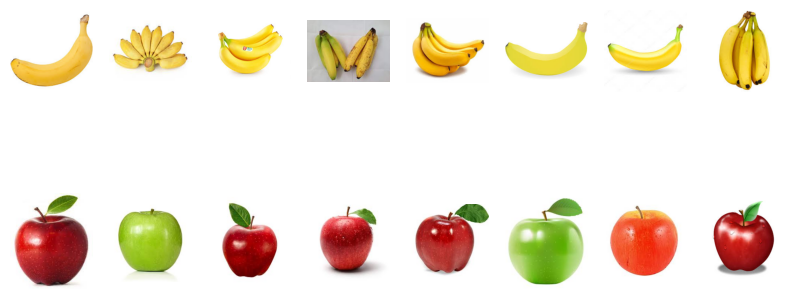

In [11]:
fig = plt.figure(figsize=(10, 7)) 
rows = 3
columns = 8
counter = 1
for i in range(len(finalarr)):
    for j in range(len(finalarr[i])):
        testing = cv2.cvtColor(finalarr[i][j], cv2.COLOR_BGR2RGB)
        
        fig.add_subplot(rows, columns, counter)
        plt.imshow(testing)
        plt.axis('off')
        counter += 1

plt.show()

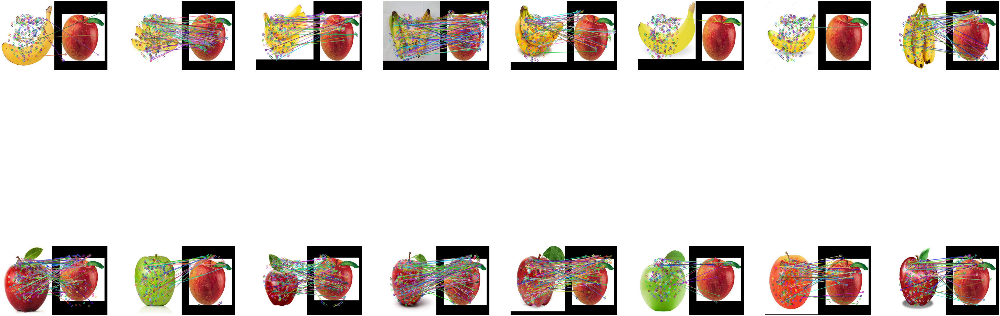

In [12]:
tempo = 0
fig = plt.figure(figsize=(100, 70)) 
rows = 3
columns = 8
counter = 1
temp = []
temp1 = []
temp2 = []
path = cv2.imread('AppleTest2.png')
path_gray = cv2.cvtColor(path, cv2.COLOR_BGR2GRAY)
for i in range(len(finalarrGray)):
    for j in range(len(finalarrGray[i])):
        key1 , desc1 , key2, desc2 = detector(path_gray, finalarrGray[i][j])
        
        no_match, no_match2 = BF_FeatureMatcher(desc1, desc2)
        # take_good = take_good_match(no_match)
        tempo += len(no_match)
        temp1.append(len(no_match2))

        final_img = cv2.drawMatches(finalarr[i][j], key1,  path, key2,no_match2, None) 

        final_img = cv2.resize(final_img, (1000,650)) 
        final_img = cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB)

        fig.add_subplot(rows, columns, counter)
        plt.imshow(final_img)
        plt.axis('off')
        counter += 1

    temp2.append(temp1)
    temp1 = []

    temp.append(tempo)
    tempo = 0

[[ 6 57 38 77 36  1  1 47]
 [76 20 67 94 91 13 40 43]]
1 3
Apel


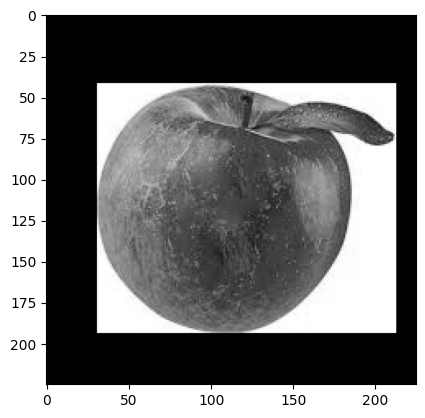

In [13]:
index_max = max(range(len(temp)), key=temp.__getitem__)
temp2 = np.array(temp2)
maxindex = temp2.argmax()

print(temp2)

a, b = np.unravel_index(temp2.argmax(), temp2.shape)
print(a,b)
# print(j)
# print(index_max)
# print(temp)
# print(Label[index_max])
print(Label[a])
plt.imshow(path_gray, cmap='gray')
plt.show()

In [14]:
query_img = cv2.imread('DataTrain/Strawberry/StrawberryTrain8.jpeg')
train_img = cv2.imread('AppleTest1.jpeg')

query_img_bw = cv2.cvtColor(query_img, cv2.COLOR_BGR2GRAY)
train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)

test_mask_query = np.ones(query_img_bw.shape, np.uint8)
test_mask_train = np.ones(train_img_bw.shape, np.uint8)

orb = cv2.ORB_create(nfeatures = 50)

kp1 , des1 = orb.detectAndCompute(query_img_bw, mask=test_mask_query)
kp2 , des2 = orb.detectAndCompute(train_img_bw, mask=test_mask_train)

matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = matcher.match(des1,des2) 

print(len(matches))

final_img = cv2.drawMatches(query_img, kp1,  
train_img, kp2, matches[:20],None) 

final_img = cv2.resize(final_img, (1000,650)) 
final_img = cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB)

plt.imshow(final_img)
plt.show()



error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [ ]:
# query_img = cv2.imread('BananaTest.png') 
# train_img = cv2.imread('BananaTrain.png') 

# print(query_img.shape)
# print(train_img.shape)

# # train_img = cv2.resize(train_img, (400, 440))

# print(query_img.shape)
# print(train_img.shape)

In [ ]:
# query_img_bw = cv2.cvtColor(query_img,cv2.COLOR_BGR2GRAY) 
# train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY) 

In [ ]:
# orb = cv2.ORB_create() 

In [ ]:
# queryKeypoints, queryDescriptors = orb.detectAndCompute(query_img_bw,None) 
# trainKeypoints, trainDescriptors = orb.detectAndCompute(train_img_bw,None) 

In [ ]:
# matcher = cv2.BFMatcher() 
# matches = matcher.match(queryDescriptors,trainDescriptors) 

In [ ]:
# final_img = cv2.drawMatches(query_img, queryKeypoints,  
# train_img, trainKeypoints, matches[:20],None) 

In [ ]:
# final_img = cv2.resize(final_img, (1000,650)) 
# final_img = cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB)

In [ ]:
# plt.imshow(final_img)
# plt.show()